# Analysis of Un/Underserved locations

## Imports

In [40]:
import os, json, itables, requests, pygris, h3pandas
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt

## WSBO Data



In [93]:
unserved =  pd.read_csv(os.path.join('data','unserved.csv'))
underserved = pd.read_csv(os.path.join('data','underserved.csv'))

In [3]:
print(f'Unserved Locations: {unserved.shape[0]}')
print(f'Underserved Locatoins: {underserved.shape[0]}')

Unserved Locations: 236134
Underserved Locatoins: 85434


## FCC Data



In [4]:
s = requests.Session()
s.headers.update({'User-Agent': 'waInitialProposal/0.0.1'})

In [5]:
url = 'https://broadbandmap.fcc.gov/nbm/map/api/published/filing'
response = s.get(url, timeout=5)
response

<Response [200]>

In [6]:
parsed = json.loads(response.content)
uuid = parsed['data'][1]['process_uuid']

In [7]:
uuid

'a5a0b15b-25e0-4215-b193-56ed792aa142'

In [8]:
url = f"https://broadbandmap.fcc.gov/nbm/map/api/national_map_process/nbm_get_data_download/{uuid}/"
response = s.get(url, timeout=5)
parsed = json.loads(response.text)

In [9]:
filingData = pd.DataFrame(parsed['data'])

In [10]:
filingData

,id,data_category,data_type,technology_code,technology_code_desc,state_fips,state_name,provider_id,filing_id,file_type,modified_date,file_name,download_available
0,288925,Nationwide,Broadband Summary by Geography Type,None,None,None,None,None,None,csv,None,bdc_us_broadband_summary_by_geography_123122,Yes
1,288927,Nationwide,Fixed Broadband,0,Other,01,Alabama,None,None,csv,None,bdc_01_Other_fixed_broadband_123122,Yes
2,288928,Nationwide,Fixed Broadband,0,Other,04,Arizona,None,None,csv,None,bdc_04_Other_fixed_broadband_123122,Yes
3,288929,Nationwide,Fixed Broadband,0,Other,06,California,None,None,csv,None,bdc_06_Other_fixed_broadband_123122,Yes
4,288930,Nationwide,Fixed Broadband,0,Other,12,Florida,None,None,csv,None,bdc_12_Other_fixed_broadband_123122,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7988,296916,Provider,Supporting Data,50,Fiber to the Premises,None,None,470127,2009560,csv,None,bdc_us_470127_FibertothePremises_supporting_da...,Yes
7989,296917,Provider,Supporting Data,50,Fiber to the Premises,None,None,470128,2009788,csv,None,bdc_us_470128_FibertothePremises_supporting_da...,Yes
7990,296918,Provider,Supporting Data,71,Licensed Fixed Wireless,None,None,470129,2009292,csv,None,bdc_us_470129_LicensedFixedWireless_supporting...,Yes
7991,296919,Provider,Supporting Data,50,Fiber to the Premises,None,None,470132,2006608,csv,None,bdc_us_470132_FibertothePremises_supporting_da...,Yes


In [11]:
waFilingData = filingData[(filingData.state_fips == '53') & (filingData.file_type == 'csv')].reset_index(drop=True)

In [12]:
waFilingData

,id,data_category,data_type,technology_code,technology_code_desc,state_fips,state_name,provider_id,filing_id,file_type,modified_date,file_name,download_available
0,288995,Nationwide,Fixed Broadband,10,Copper,53,Washington,None,None,csv,None,bdc_53_Copper_fixed_broadband_123122,Yes
1,289049,Nationwide,Fixed Broadband,40,Cable,53,Washington,None,None,csv,None,bdc_53_Cable_fixed_broadband_123122,Yes
2,289105,Nationwide,Fixed Broadband,50,Fiber to the Premises,53,Washington,None,None,csv,None,bdc_53_FibertothePremises_fixed_broadband_123122,Yes
3,289160,Nationwide,Fixed Broadband,60,GSO Satellite,53,Washington,None,None,csv,None,bdc_53_GSOSatellite_fixed_broadband_123122,Yes
4,289213,Nationwide,Fixed Broadband,61,NGSO Satellite,53,Washington,None,None,csv,None,bdc_53_NGSOSatellite_fixed_broadband_123122,Yes
5,289264,Nationwide,Fixed Broadband,70,Unlicensed Fixed Wireless,53,Washington,None,None,csv,None,bdc_53_UnlicensedFixedWireless_fixed_broadband...,Yes
6,289319,Nationwide,Fixed Broadband,71,Licensed Fixed Wireless,53,Washington,None,None,csv,None,bdc_53_LicensedFixedWireless_fixed_broadband_1...,Yes
7,289364,Nationwide,Fixed Broadband,72,LBR Fixed Wireless,53,Washington,None,None,csv,None,bdc_53_LBRFixedWireless_fixed_broadband_123122,Yes


Implement download function here

### Pre-Cached Data

Retrieved 10-14-2023 based on data from 10-10-2023.

In [13]:
waFabricData = pd.DataFrame()

for file in os.listdir(os.path.join('data', 'csvs')):
    print(file)
    df = pd.read_csv(os.path.join('data', 'csvs', file))
    waFabricData = pd.concat([waFabricData, df], ignore_index=True)

bdc_53_Cable_fixed_broadband_123122.csv
bdc_53_Copper_fixed_broadband_123122.csv
bdc_53_FibertothePremises_fixed_broadband_123122.csv
bdc_53_GSOSatellite_fixed_broadband_123122.csv
bdc_53_LBRFixedWireless_fixed_broadband_123122.csv
bdc_53_LicensedFixedWireless_fixed_broadband_123122.csv
bdc_53_NGSOSatellite_fixed_broadband_123122.csv


In [14]:
waFabricData.to_parquet(os.path.join('data', 'waFabricData.parquet'))

In [15]:
waFabricData = pd.read_parquet(os.path.join('data', 'waFabricData.parquet'))

In [16]:
waFabricData

,frn,provider_id,brand_name,location_id,technology,max_advertised_download_speed,max_advertised_upload_speed,low_latency,business_residential_code,state_usps,block_geoid,h3_res8_id
0,3768165,130317,Xfinity,1015880838,40,1200,35,1,X,WA,530659514022053,8812db0811fffff
1,3768165,130317,Xfinity,1063122914,40,1200,35,1,X,WA,530150020013011,8828f38e69fffff
2,3768165,130317,Xfinity,1063124469,40,1200,35,1,X,WA,530150020012011,8828f38c4bfffff
3,3768165,130317,Xfinity,1063130307,40,1200,35,1,X,WA,530150016012074,8828f3930dfffff
4,3768165,130317,Xfinity,1063138082,40,1200,35,1,X,WA,530150017001001,8828f3818bfffff
...,...,...,...,...,...,...,...,...,...,...,...,...
18045857,26043968,430076,Starlink,1410075068,61,50,10,1,R,WA,530019503021020,8828895919fffff
18045858,26043968,430076,Starlink,1367080933,61,50,10,1,R,WA,530330233004008,8828d558c9fffff
18045859,26043968,430076,Starlink,1410102057,61,50,10,1,R,WA,530250114032003,88288919dbfffff
18045860,26043968,430076,Starlink,1367081504,61,50,10,1,R,WA,530330302033005,8828d5c13dfffff


In [17]:
columnsToDrop = [
    "frn",
    "provider_id",
    "brand_name",
    "technology",
    "max_advertised_download_speed",
    "max_advertised_upload_speed",
    "low_latency",
    "business_residential_code",
    "state_usps",
]
locationLookup = waFabricData.drop(columns=columnsToDrop)

In [18]:
locationLookup = locationLookup.drop_duplicates()

In [19]:
locationLookup

,location_id,block_geoid,h3_res8_id
0,1015880838,530659514022053,8812db0811fffff
1,1063122914,530150020013011,8828f38e69fffff
2,1063124469,530150020012011,8828f38c4bfffff
3,1063130307,530150016012074,8828f3930dfffff
4,1063138082,530150017001001,8828f3818bfffff
...,...,...,...
12535493,1342726865,530630102012023,8812db153dfffff
12535497,1342737225,530630103042005,8812db1147fffff
12535499,1342737372,530630104032044,8812db701dfffff
12535507,1342746597,530630112024002,8812db0cdbfffff


In [20]:
locationLookup['hexBlock'] = locationLookup.h3_res8_id.astype('str') + '+' + locationLookup.block_geoid.astype('str')

In [21]:
itables.show(locationLookup)

## Unserved Analysis

In [22]:
unserved = unserved.merge(locationLookup, how='left', left_on='Unserved Location IDs', right_on='location_id')
unserved = unserved.drop(columns='underservedd Location IDs')

In [25]:
unserved

,location_id,block_geoid,h3_res8_id,hexBlock
0,1410015656,530619400023079,8828d0a4adfffff,8828d0a4adfffff+530619400023079
1,1409662696,530519701003162,8812d8748bfffff,8812d8748bfffff+530519701003162
2,1342736839,530630103053009,8812db0035fffff,8812db0035fffff+530630103053009
3,1342719613,530630133002010,8812db2851fffff,8812db2851fffff+530630133002010
4,1337285868,530610535112008,8828d0ac03fffff,8828d0ac03fffff+530610535112008
...,...,...,...,...
236129,1105695176,530419708001006,8828f305bdfffff,8828f305bdfffff+530419708001006
236130,1049493621,530479709001119,8828d2ab6bfffff,8828d2ab6bfffff+530479709001119
236131,1015918336,530659511002012,8812dbc237fffff,8812dbc237fffff+530659511002012
236132,1056645894,530499502002095,8828c6c831fffff,8828c6c831fffff+530499502002095


In [26]:
columnsToDrop = [
    'location_id',
    'block_geoid',
    'hexBlock'
]
unserved = unserved.drop(columns=columnsToDrop)
unserved = unserved.groupby('h3_res8_id').size().reset_index().rename(columns={0: 'bsls'})
unserved = unserved.set_index('h3_res8_id')
unserved = unserved.h3.h3_to_geo_boundary()
unserved = unserved.reset_index()
unserved = gpd.GeoDataFrame(unserved)
unserved = unserved.to_crs(epsg=3857)

In [35]:
# unserved.explore(column='bsls')

<Axes: >

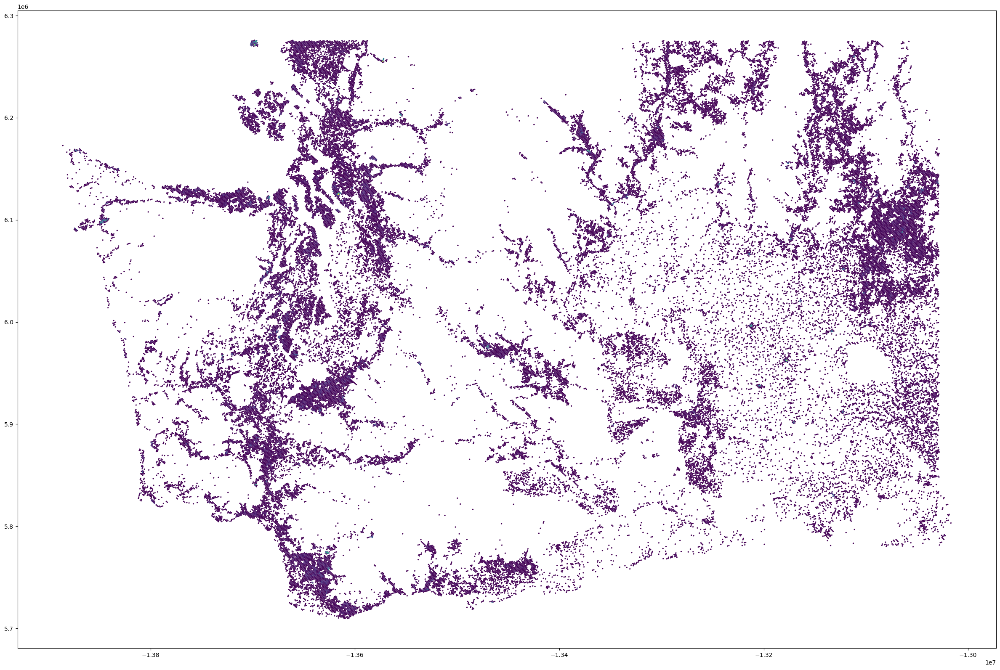

In [56]:
unserved.plot(figsize=(30,30), column='bsls')

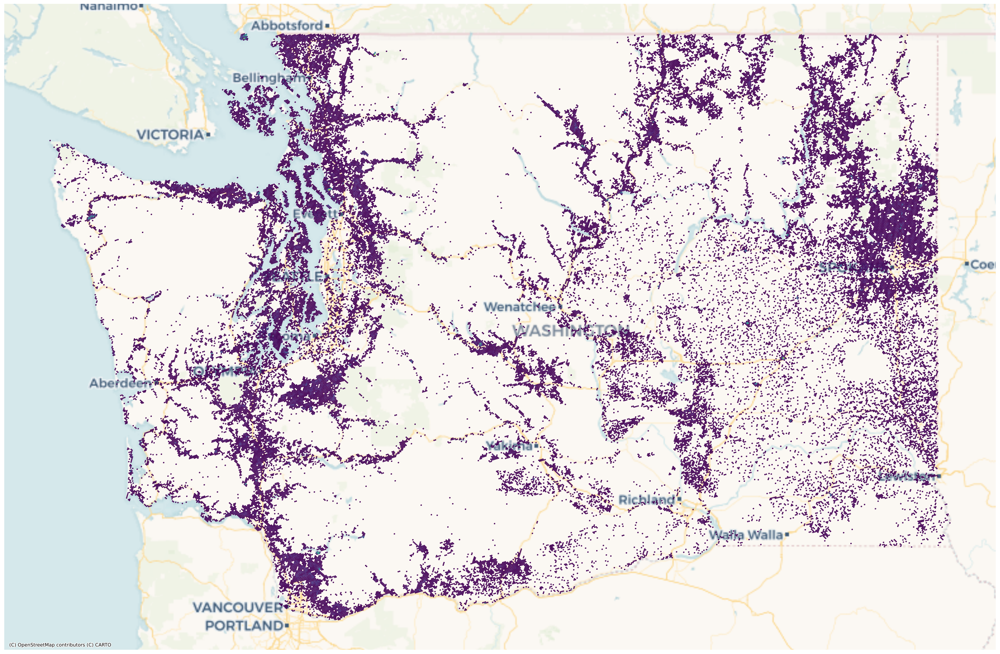

In [80]:
fig, ax2 = plt.subplots(figsize=(30, 25))
unserved.plot(ax=ax2, column='bsls')
ctx.add_basemap(ax=ax2, crs='epsg:3857', source=ctx.providers.CartoDB.Voyager)
ax2.axis('off')
plt.savefig(os.path.join('export', 'unservedWashington.png'), format='png', bbox_inches='tight', pad_inches=0)

In [36]:
waCounties = pygris.counties(state='WA', cache=True)

Using the default year of 2021
Using FIPS code '53' for input 'WA'


In [63]:
waCounties = waCounties.to_crs(epsg=3857)

In [64]:
county = waCounties[waCounties.NAME == 'Whitman']

<Axes: >

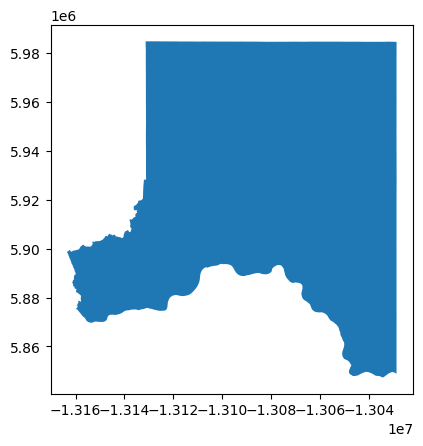

In [65]:
county.plot()

<Axes: >

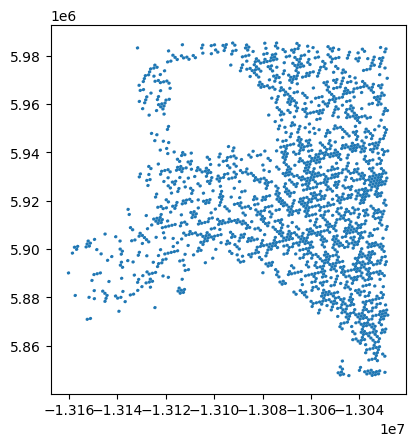

In [71]:
gpd.sjoin(unserved, county).plot()

(-13170260.548129193, -13020687.43139289, 5840050.135202477, 5992849.823387821)

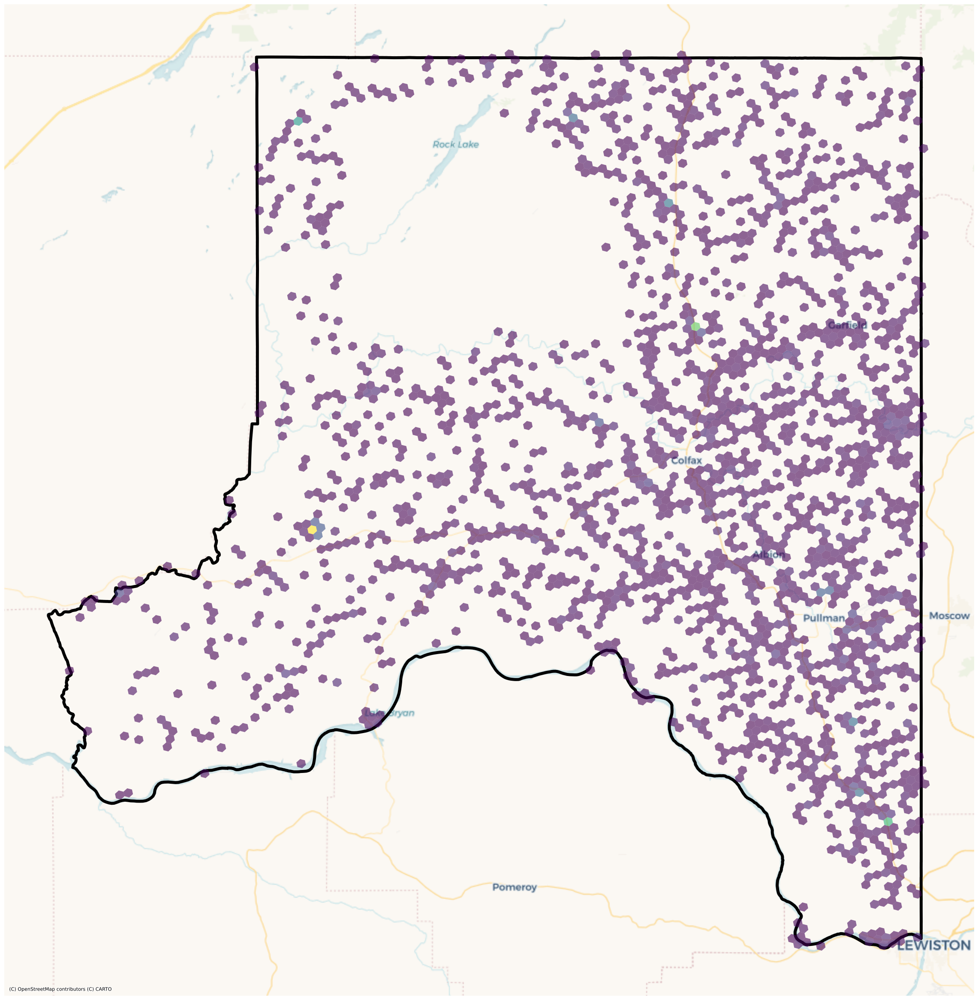

In [76]:
fig, ax2 = plt.subplots(figsize = (30,30))
waCounties[waCounties.NAME == 'Whitman'].to_crs(epsg=3857).plot(ax=ax2, facecolor='none', edgecolor='black', lw=5)
# cai.plot(ax=ax2)
intersectUnserved = gpd.sjoin(unserved, county)
intersectUnserved.plot(ax=ax2, column='bsls', alpha=.6)
ctx.add_basemap(ax=ax2, crs='EPSG:3857', source=ctx.providers.CartoDB.Voyager)
ax2.axis('off')

In [79]:
for county in waCounties.NAME:
    print(county)
    fig, ax2 = plt.subplots(figsize=(30, 30))
    waCounties[waCounties.NAME == county].to_crs('EPSG:3857').plot(ax=ax2, facecolor='none', edgecolor='black', lw=5)
    intersectUnserved = gpd.sjoin(unserved, waCounties[waCounties.NAME == county])
    intersectUnserved.plot(ax=ax2, column='bsls', alpha=.6)
    ctx.add_basemap(ax=ax2, crs='epsg:3857', source=ctx.providers.CartoDB.Voyager)
    ax2.axis('off')
    plt.savefig(os.path.join('export', 'unserved', f'{county}.png'), format='png', bbox_inches='tight', pad_inches=0)
    plt.close()

Wahkiakum
Lewis
Jefferson
Columbia
Kittitas
Snohomish
Yakima
Okanogan
Spokane
Island
Clallam
Stevens
Pend Oreille
Whatcom
Chelan
Asotin
Ferry
Douglas
Benton
Garfield
King
Pacific
Klickitat
San Juan
Grays Harbor
Cowlitz
Walla Walla
Grant
Adams
Clark
Lincoln
Kitsap
Whitman
Mason
Skagit
Pierce
Thurston
Franklin
Skamania


## Underserved

In [94]:
underserved = underserved.merge(locationLookup, how='left', left_on='Underserved Location IDs', right_on='location_id')
columnsToDrop = [
    'location_id',
    'block_geoid',
    'hexBlock',
    'Underserved Location IDs'
]
underserved = underserved.drop(columns=columnsToDrop)

In [95]:
underserved = underserved.groupby('h3_res8_id').size().reset_index().rename(columns={0: 'bsls'})
underserved = underserved.set_index('h3_res8_id')
underserved = underserved.h3.h3_to_geo_boundary()
underserved = underserved.reset_index()
underserved = gpd.GeoDataFrame(underserved)
underserved = underserved.to_crs(epsg=3857)

In [99]:
# underserved.explore(column='bsls')

<Axes: >

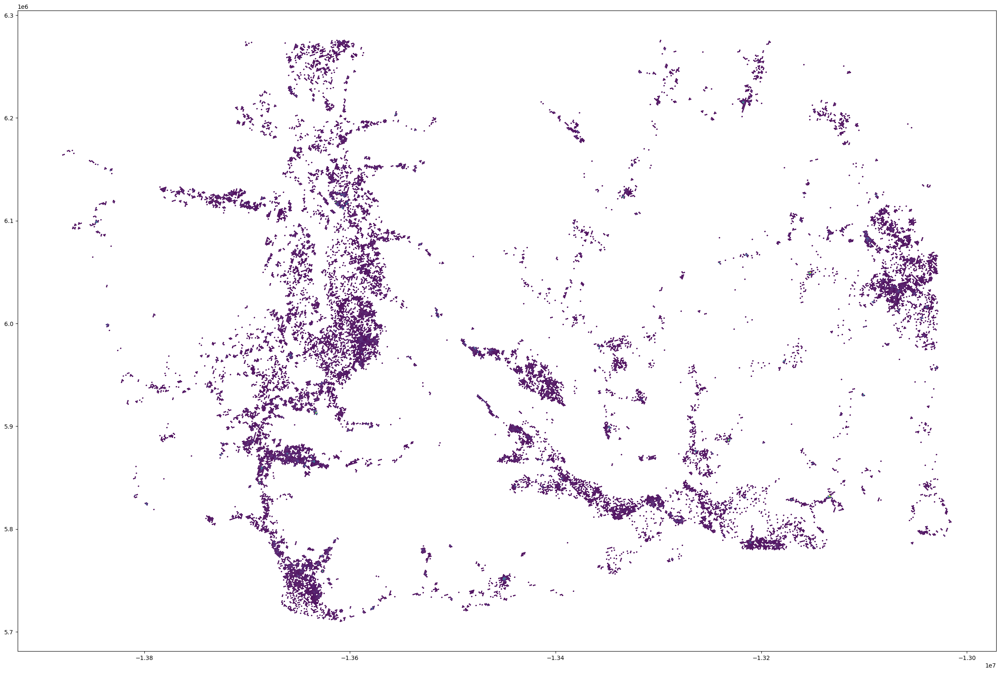

In [101]:
underserved.plot(figsize=(30,30), column='bsls')

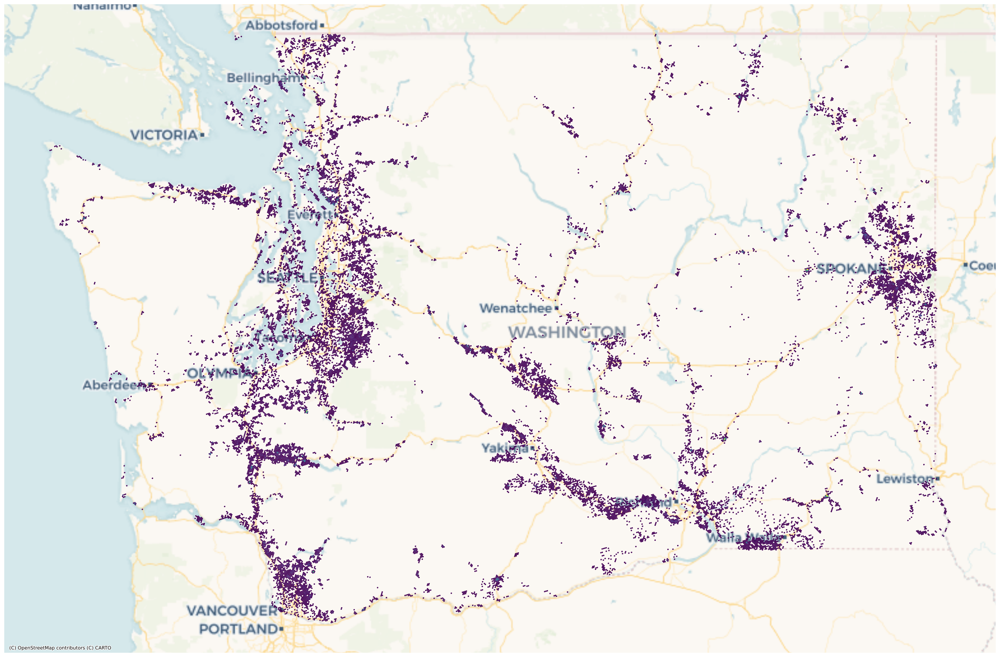

In [102]:
fig, ax2 = plt.subplots(figsize=(30, 25))
underserved.plot(ax=ax2, column='bsls')
ctx.add_basemap(ax=ax2, crs='epsg:3857', source=ctx.providers.CartoDB.Voyager)
ax2.axis('off')
plt.savefig(os.path.join('export', 'underservedWashington.png'), format='png', bbox_inches='tight', pad_inches=0)

In [104]:
for county in waCounties.NAME:
    print(county)
    fig, ax2 = plt.subplots(figsize=(30, 30))
    waCounties[waCounties.NAME == county].to_crs('EPSG:3857').plot(ax=ax2, facecolor='none', edgecolor='black', lw=5)
    intersectUnderserved = gpd.sjoin(underserved, waCounties[waCounties.NAME == county])
    intersectUnderserved.plot(ax=ax2, column='bsls', alpha=.6)
    ctx.add_basemap(ax=ax2, crs='epsg:3857', source=ctx.providers.CartoDB.Voyager)
    ax2.axis('off')
    plt.savefig(os.path.join('export', 'underserved', f'{county}.png'), format='png', bbox_inches='tight', pad_inches=0)
    plt.close()

Wahkiakum
Lewis
Jefferson
Columbia
Kittitas
Snohomish
Yakima
Okanogan
Spokane
Island
Clallam
Stevens
Pend Oreille
Whatcom
Chelan
Asotin
Ferry
Douglas
Benton
Garfield
King
Pacific
Klickitat
San Juan
Grays Harbor
Cowlitz
Walla Walla
Grant
Adams
Clark
Lincoln
Kitsap
Whitman
Mason
Skagit
Pierce
Thurston
Franklin
Skamania
